In [2]:
from google.colab import files
files.upload()

Saving data_processed.zip to data_processed.zip


{'data_processed.zip': b'PK\x03\x04\x14\x00\x00\x00\x00\x00\xf3\xbbz[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00 \x00padded_data_processed/ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07k+\'iT3\'i;&\'iPK\x03\x04\x14\x00\x00\x00\x00\x00\x14\xbcz[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00 \x00padded_data_processed/Abraham Ganda Napitu/ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07\xa9+\'iT3\'i\x9e*\'iPK\x03\x04\x14\x00\x08\x00\x08\x00\x13\xbcz[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00 \x00padded_data_processed/Abraham Ganda Napitu/IMG_2138 - Abraham Ganda Napitu.jpegux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00UT\r\x00\x07\xa7+\'iK,\'i\xa7+\'i\x9d\x97eX\x14\xc0\xdb\xee\x97\\\x1a)%\x96\\BR\xba[A\xba\x97\xee\x94\xee\x16i\x90u\xa9\xa5\xbb\\\xba\xa5C@\xbaci\x91N\t\xa5\xa5_\xfe\xefu\xe2\xcb\xf9p\xcey\xe6\xe3<\xd7\\\xf3\x9b\x99\xeb\xbe\xefyZ|Z\x07\xbcP\x92W\x94\x07\xa0\xa0\x00\x00(\xcf\x03\xf0\xf4\x13\xf0\x16\x

In [3]:
!unzip data_processed.zip

Archive:  data_processed.zip
   creating: padded_data_processed/
   creating: padded_data_processed/Abraham Ganda Napitu/
  inflating: padded_data_processed/Abraham Ganda Napitu/IMG_2138 - Abraham Ganda Napitu.jpeg  
  inflating: padded_data_processed/Abraham Ganda Napitu/IMG_3693 - Abraham Ganda Napitu.jpeg  
  inflating: padded_data_processed/Abraham Ganda Napitu/IMG_4951 - Abraham Ganda Napitu.jpeg  
  inflating: padded_data_processed/Abraham Ganda Napitu/IMG_5357 - Abraham Ganda Napitu.jpeg  
   creating: padded_data_processed/Abu Bakar Siddiq Siregar/
  inflating: padded_data_processed/Abu Bakar Siddiq Siregar/1 - I22I4OI64_ ABU BAKAR SIDDIQ SIREGAR.jpeg  
  inflating: padded_data_processed/Abu Bakar Siddiq Siregar/2 - I22I4OI64_ ABU BAKAR SIDDIQ SIREGAR.jpeg  
  inflating: padded_data_processed/Abu Bakar Siddiq Siregar/3 - I22I4OI64_ ABU BAKAR SIDDIQ SIREGAR.jpeg  
  inflating: padded_data_processed/Abu Bakar Siddiq Siregar/4 - I22I4OI64_ ABU BAKAR SIDDIQ SIREGAR.jpeg  
   creati

In [4]:
import os
import glob
import cv2
import torch
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A

from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score
# IMPORT RESNET
from torchvision.models import resnet18, ResNet18_Weights
from torch import nn, optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.notebook import tqdm

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(42)

# KONFIGURASI (ResNet-18 Standar)
CONFIG = {
    'DATA_DIR': '/content/padded_data_processed',
    'IMG_SIZE': 224,
    'BATCH_SIZE': 16,
    'EPOCHS_PER_FOLD': 20,
    'LEARNING_RATE': 1e-3,
    'N_FOLDS': 4,
    'DEVICE': 'cuda' if torch.cuda.is_available() else 'cpu'
}

class MahasiswaDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        path = self.image_paths[idx]
        label = self.labels[idx]
        image = cv2.imread(path, cv2.IMREAD_COLOR)
        if image is None:
            image = np.zeros((CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3), dtype=np.uint8)
        else:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        return image, torch.tensor(label, dtype=torch.long)

# Augmentasi Standar ImageNet
train_transforms = A.Compose([
    A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10, p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transforms = A.Compose([
    A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

def load_data(root_dir):
    image_paths, labels = [], []
    classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
    class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    for cls_name in classes:
        cls_dir = os.path.join(root_dir, cls_name)
        files = []
        for ext in ['*.jpg', '*.jpeg', '*.png', '*.webp']:
            files.extend(glob.glob(os.path.join(cls_dir, ext)))
        for f in files:
            image_paths.append(f)
            labels.append(class_to_idx[cls_name])
    return np.array(image_paths), np.array(labels), classes

In [7]:
# Helper Functions
def train_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for imgs, lbls in tqdm(loader, desc="Train", leave=False):
        imgs, lbls = imgs.to(CONFIG['DEVICE']), lbls.to(CONFIG['DEVICE'])
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, lbls)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == lbls).sum().item()
        total += lbls.size(0)
    return total_loss / len(loader), correct / total

def eval_epoch(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    with torch.no_grad():
        for imgs, lbls in tqdm(loader, desc="Val", leave=False):
            imgs, lbls = imgs.to(CONFIG['DEVICE']), lbls.to(CONFIG['DEVICE'])
            outputs = model(imgs)
            loss = criterion(outputs, lbls)
            total_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == lbls).sum().item()
            total += lbls.size(0)
    return total_loss / len(loader), correct / total

# --- EXECUTION RESNET-18 WITH HISTORY ---
X, y, class_names = load_data(CONFIG['DATA_DIR'])
skf = StratifiedKFold(n_splits=CONFIG['N_FOLDS'], shuffle=True, random_state=42)

fold_perf = []
best_global_acc = 0.0

# Wadah untuk menyimpan history dari SEMUA fold
# Struktur: [ {'train_loss': [], 'val_loss': [], ...},  {...} ]
all_folds_history = []

print(f"🚀 Memulai Training ResNet-18 ({CONFIG['N_FOLDS']}-Fold)...")

for fold_idx, (train_index, val_index) in enumerate(skf.split(X, y)):
    print(f"\n🔄 FOLD {fold_idx+1}/{CONFIG['N_FOLDS']}")

    # Init History untuk Fold ini
    current_fold_history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': []
    }

    # A. Split
    X_train_fold, X_val_fold = X[train_index], X[val_index]
    y_train_fold, y_val_fold = y[train_index], y[val_index]

    train_ds = MahasiswaDataset(X_train_fold, y_train_fold, transform=train_transforms)
    val_ds = MahasiswaDataset(X_val_fold, y_val_fold, transform=val_transforms)
    train_loader = DataLoader(train_ds, batch_size=CONFIG['BATCH_SIZE'], shuffle=True, num_workers=2)
    val_loader = DataLoader(val_ds, batch_size=CONFIG['BATCH_SIZE'], shuffle=False, num_workers=2)

    # B. Model Setup
    model = resnet18(weights=ResNet18_Weights.DEFAULT)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(class_names))
    model = model.to(CONFIG['DEVICE'])

    optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-3)
    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

    # C. Loop
    best_fold_acc = 0.0
    for epoch in range(CONFIG['EPOCHS_PER_FOLD']):
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
        val_loss, val_acc = eval_epoch(model, val_loader, criterion)
        scheduler.step(val_loss)

        # --- SIMPAN HISTORY ---
        current_fold_history['train_loss'].append(train_loss)
        current_fold_history['train_acc'].append(train_acc)
        current_fold_history['val_loss'].append(val_loss)
        current_fold_history['val_acc'].append(val_acc)

        if val_acc > best_fold_acc:
            best_fold_acc = val_acc
            if val_acc > best_global_acc:
                best_global_acc = val_acc
                torch.save(model.state_dict(), 'best_resnet18_model.pth')

        print(f"   Ep {epoch+1} | T.Loss: {train_loss:.3f} T.Acc: {train_acc:.1%} | V.Loss: {val_loss:.3f} V.Acc: {val_acc:.1%}")

    # Simpan history fold ini ke list global
    all_folds_history.append(current_fold_history)
    fold_perf.append(best_fold_acc)
    print(f"✅ Selesai Fold {fold_idx+1}. Best: {best_fold_acc:.2%}")

print(f"\n🏆 Rata-rata Akurasi ResNet-18: {sum(fold_perf)/len(fold_perf):.2%}")

🚀 Memulai Training ResNet-18 (4-Fold)...

🔄 FOLD 1/4


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  warnings.warn(


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 1 | T.Loss: 4.297 T.Acc: 5.0% | V.Loss: 3.954 V.Acc: 19.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 2 | T.Loss: 3.094 T.Acc: 55.0% | V.Loss: 3.324 V.Acc: 41.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 3 | T.Loss: 2.416 T.Acc: 84.9% | V.Loss: 2.920 V.Acc: 53.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 4 | T.Loss: 1.888 T.Acc: 95.9% | V.Loss: 2.672 V.Acc: 58.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 5 | T.Loss: 1.498 T.Acc: 98.6% | V.Loss: 2.498 V.Acc: 60.3%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 6 | T.Loss: 1.271 T.Acc: 98.6% | V.Loss: 2.393 V.Acc: 60.3%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 7 | T.Loss: 1.083 T.Acc: 100.0% | V.Loss: 2.326 V.Acc: 61.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 8 | T.Loss: 0.991 T.Acc: 99.5% | V.Loss: 2.248 V.Acc: 64.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 9 | T.Loss: 0.908 T.Acc: 100.0% | V.Loss: 2.207 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 10 | T.Loss: 0.864 T.Acc: 100.0% | V.Loss: 2.166 V.Acc: 65.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 11 | T.Loss: 0.834 T.Acc: 100.0% | V.Loss: 2.164 V.Acc: 64.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 12 | T.Loss: 0.830 T.Acc: 100.0% | V.Loss: 2.137 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 13 | T.Loss: 0.809 T.Acc: 100.0% | V.Loss: 2.117 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 14 | T.Loss: 0.806 T.Acc: 100.0% | V.Loss: 2.124 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 15 | T.Loss: 0.791 T.Acc: 100.0% | V.Loss: 2.111 V.Acc: 65.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 16 | T.Loss: 0.789 T.Acc: 100.0% | V.Loss: 2.111 V.Acc: 65.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 17 | T.Loss: 0.800 T.Acc: 100.0% | V.Loss: 2.109 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 18 | T.Loss: 0.789 T.Acc: 100.0% | V.Loss: 2.116 V.Acc: 65.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 19 | T.Loss: 0.789 T.Acc: 100.0% | V.Loss: 2.095 V.Acc: 65.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 20 | T.Loss: 0.784 T.Acc: 100.0% | V.Loss: 2.081 V.Acc: 65.8%
✅ Selesai Fold 1. Best: 67.12%

🔄 FOLD 2/4


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 1 | T.Loss: 4.268 T.Acc: 4.1% | V.Loss: 3.957 V.Acc: 16.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 2 | T.Loss: 3.008 T.Acc: 56.9% | V.Loss: 3.383 V.Acc: 41.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 3 | T.Loss: 2.332 T.Acc: 84.4% | V.Loss: 3.010 V.Acc: 50.7%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 4 | T.Loss: 1.843 T.Acc: 94.5% | V.Loss: 2.776 V.Acc: 58.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 5 | T.Loss: 1.494 T.Acc: 99.5% | V.Loss: 2.603 V.Acc: 63.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 6 | T.Loss: 1.256 T.Acc: 100.0% | V.Loss: 2.473 V.Acc: 61.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 7 | T.Loss: 1.069 T.Acc: 100.0% | V.Loss: 2.419 V.Acc: 64.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 8 | T.Loss: 0.957 T.Acc: 100.0% | V.Loss: 2.354 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 9 | T.Loss: 0.910 T.Acc: 99.5% | V.Loss: 2.308 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 10 | T.Loss: 0.882 T.Acc: 100.0% | V.Loss: 2.280 V.Acc: 71.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 11 | T.Loss: 0.851 T.Acc: 100.0% | V.Loss: 2.213 V.Acc: 72.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 12 | T.Loss: 0.827 T.Acc: 100.0% | V.Loss: 2.170 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 13 | T.Loss: 0.810 T.Acc: 100.0% | V.Loss: 2.201 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 14 | T.Loss: 0.815 T.Acc: 99.5% | V.Loss: 2.177 V.Acc: 69.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 15 | T.Loss: 0.799 T.Acc: 100.0% | V.Loss: 2.166 V.Acc: 69.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 16 | T.Loss: 0.790 T.Acc: 100.0% | V.Loss: 2.142 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 17 | T.Loss: 0.792 T.Acc: 100.0% | V.Loss: 2.154 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 18 | T.Loss: 0.786 T.Acc: 100.0% | V.Loss: 2.155 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 19 | T.Loss: 0.785 T.Acc: 100.0% | V.Loss: 2.140 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 20 | T.Loss: 0.791 T.Acc: 100.0% | V.Loss: 2.153 V.Acc: 68.5%
✅ Selesai Fold 2. Best: 72.60%

🔄 FOLD 3/4


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 1 | T.Loss: 4.278 T.Acc: 6.0% | V.Loss: 3.809 V.Acc: 19.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 2 | T.Loss: 3.141 T.Acc: 52.8% | V.Loss: 3.300 V.Acc: 45.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 3 | T.Loss: 2.430 T.Acc: 85.3% | V.Loss: 2.937 V.Acc: 56.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 4 | T.Loss: 1.904 T.Acc: 95.9% | V.Loss: 2.674 V.Acc: 64.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 5 | T.Loss: 1.611 T.Acc: 98.2% | V.Loss: 2.506 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 6 | T.Loss: 1.310 T.Acc: 98.6% | V.Loss: 2.412 V.Acc: 71.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 7 | T.Loss: 1.117 T.Acc: 99.1% | V.Loss: 2.331 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 8 | T.Loss: 0.978 T.Acc: 100.0% | V.Loss: 2.271 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 9 | T.Loss: 0.931 T.Acc: 100.0% | V.Loss: 2.252 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 10 | T.Loss: 0.880 T.Acc: 99.5% | V.Loss: 2.237 V.Acc: 69.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 11 | T.Loss: 0.841 T.Acc: 100.0% | V.Loss: 2.218 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 12 | T.Loss: 0.831 T.Acc: 100.0% | V.Loss: 2.181 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 13 | T.Loss: 0.813 T.Acc: 100.0% | V.Loss: 2.140 V.Acc: 68.5%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 14 | T.Loss: 0.815 T.Acc: 100.0% | V.Loss: 2.136 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 15 | T.Loss: 0.806 T.Acc: 100.0% | V.Loss: 2.140 V.Acc: 67.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 16 | T.Loss: 0.813 T.Acc: 100.0% | V.Loss: 2.137 V.Acc: 69.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 17 | T.Loss: 0.803 T.Acc: 100.0% | V.Loss: 2.132 V.Acc: 69.9%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 18 | T.Loss: 0.789 T.Acc: 100.0% | V.Loss: 2.097 V.Acc: 71.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 19 | T.Loss: 0.790 T.Acc: 100.0% | V.Loss: 2.101 V.Acc: 71.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 20 | T.Loss: 0.787 T.Acc: 100.0% | V.Loss: 2.100 V.Acc: 72.6%
✅ Selesai Fold 3. Best: 72.60%

🔄 FOLD 4/4


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 1 | T.Loss: 4.314 T.Acc: 6.4% | V.Loss: 3.959 V.Acc: 15.3%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 2 | T.Loss: 3.132 T.Acc: 51.1% | V.Loss: 3.345 V.Acc: 43.1%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 3 | T.Loss: 2.424 T.Acc: 80.4% | V.Loss: 2.947 V.Acc: 47.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 4 | T.Loss: 1.892 T.Acc: 95.0% | V.Loss: 2.671 V.Acc: 59.7%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 5 | T.Loss: 1.501 T.Acc: 98.6% | V.Loss: 2.521 V.Acc: 66.7%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 6 | T.Loss: 1.233 T.Acc: 99.5% | V.Loss: 2.390 V.Acc: 72.2%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 7 | T.Loss: 1.068 T.Acc: 100.0% | V.Loss: 2.300 V.Acc: 75.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 8 | T.Loss: 0.978 T.Acc: 100.0% | V.Loss: 2.245 V.Acc: 73.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 9 | T.Loss: 0.922 T.Acc: 99.5% | V.Loss: 2.182 V.Acc: 75.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 10 | T.Loss: 0.870 T.Acc: 100.0% | V.Loss: 2.158 V.Acc: 75.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 11 | T.Loss: 0.845 T.Acc: 100.0% | V.Loss: 2.124 V.Acc: 73.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 12 | T.Loss: 0.826 T.Acc: 100.0% | V.Loss: 2.086 V.Acc: 75.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 13 | T.Loss: 0.814 T.Acc: 100.0% | V.Loss: 2.081 V.Acc: 73.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 14 | T.Loss: 0.801 T.Acc: 100.0% | V.Loss: 2.094 V.Acc: 73.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 15 | T.Loss: 0.806 T.Acc: 100.0% | V.Loss: 2.066 V.Acc: 73.6%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 16 | T.Loss: 0.799 T.Acc: 100.0% | V.Loss: 2.088 V.Acc: 75.0%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 17 | T.Loss: 0.792 T.Acc: 100.0% | V.Loss: 2.071 V.Acc: 77.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 18 | T.Loss: 0.783 T.Acc: 100.0% | V.Loss: 2.059 V.Acc: 77.8%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 19 | T.Loss: 0.788 T.Acc: 100.0% | V.Loss: 2.064 V.Acc: 76.4%


Train:   0%|          | 0/14 [00:00<?, ?it/s]

Val:   0%|          | 0/5 [00:00<?, ?it/s]

   Ep 20 | T.Loss: 0.783 T.Acc: 100.0% | V.Loss: 2.045 V.Acc: 75.0%
✅ Selesai Fold 4. Best: 77.78%

🏆 Rata-rata Akurasi ResNet-18: 72.53%


🔍 Evaluasi ResNet-18...
🏆 ResNet-18 Accuracy: 77.78%
⚖️ ResNet-18 F1-Score: 0.7213


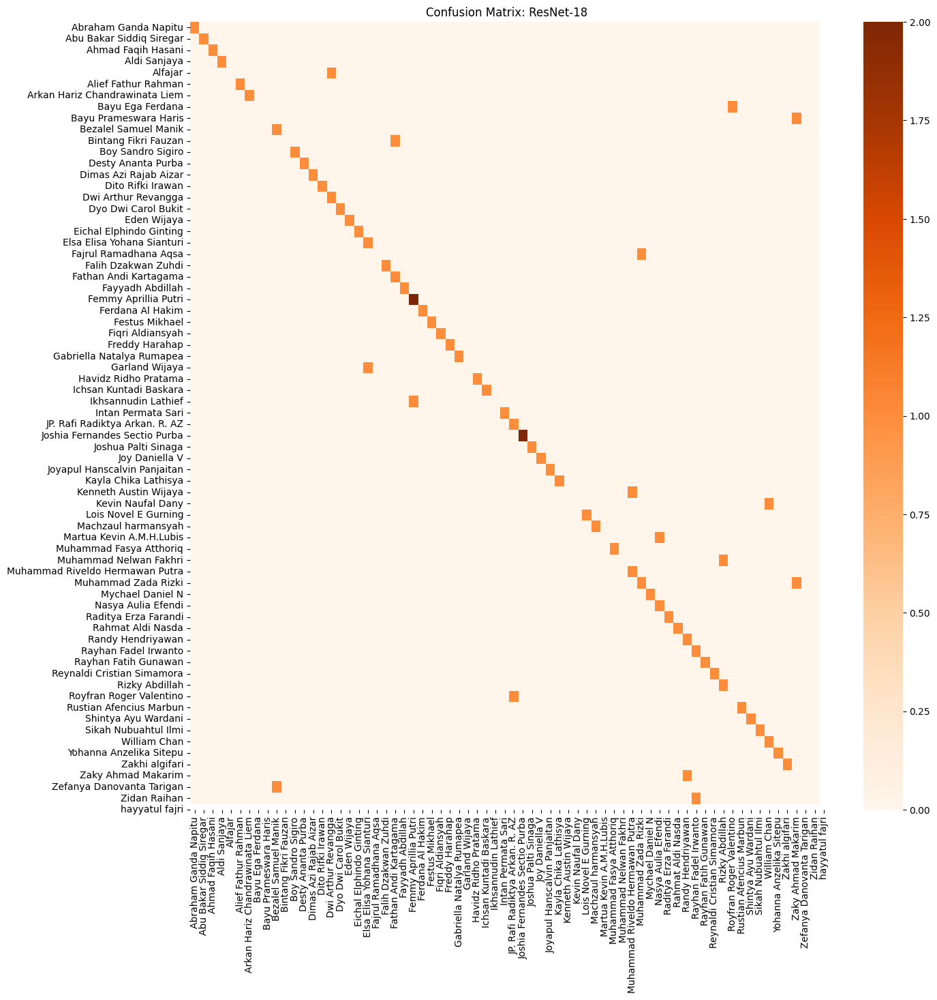


🖼️ Preview Hasil ResNet-18:


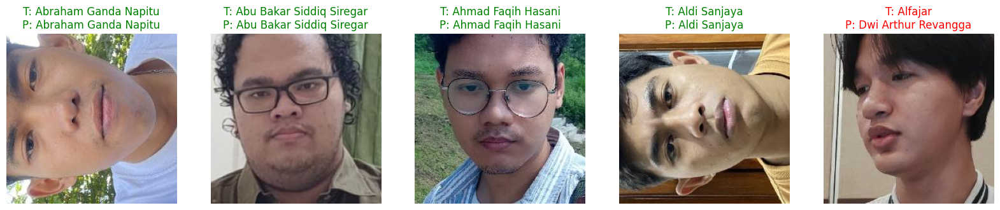

In [8]:
# Load Model Terbaik
print("🔍 Evaluasi ResNet-18...")
model = resnet18(weights=None)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(class_names))
model.load_state_dict(torch.load('best_resnet18_model.pth'))
model.to(CONFIG['DEVICE'])
model.eval()

# Generate Predictions
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, lbls in val_loader: # Gunakan loader terakhir
        imgs = imgs.to(CONFIG['DEVICE'])
        outputs = model(imgs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.numpy())

# Metrics
acc = accuracy_score(all_labels, all_preds)
f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
print(f"🏆 ResNet-18 Accuracy: {acc:.2%}")
print(f"⚖️ ResNet-18 F1-Score: {f1:.4f}")

# Plot Matrix
plt.figure(figsize=(15, 15))
cm = confusion_matrix(all_labels, all_preds)
sns.heatmap(cm, annot=False, cmap='Oranges', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix: ResNet-18')
plt.show()

# Preview
print("\n🖼️ Preview Hasil ResNet-18:")
data_iter = iter(val_loader)
images, labels = next(data_iter)
images, labels = images.to(CONFIG['DEVICE']), labels.to(CONFIG['DEVICE'])
outputs = model(images)
_, preds = torch.max(outputs, 1)

plt.figure(figsize=(20, 5))
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

for i in range(min(5, len(images))):
    ax = plt.subplot(1, 5, i + 1)
    img = images[i].cpu() * std + mean
    img = np.clip(img.permute(1, 2, 0).numpy(), 0, 1)

    true_idx, pred_idx = labels[i].item(), preds[i].item()
    color = 'green' if true_idx == pred_idx else 'red'
    plt.imshow(img)
    plt.title(f"T: {class_names[true_idx]}\nP: {class_names[pred_idx]}", color=color)
    plt.axis('off')
plt.show()

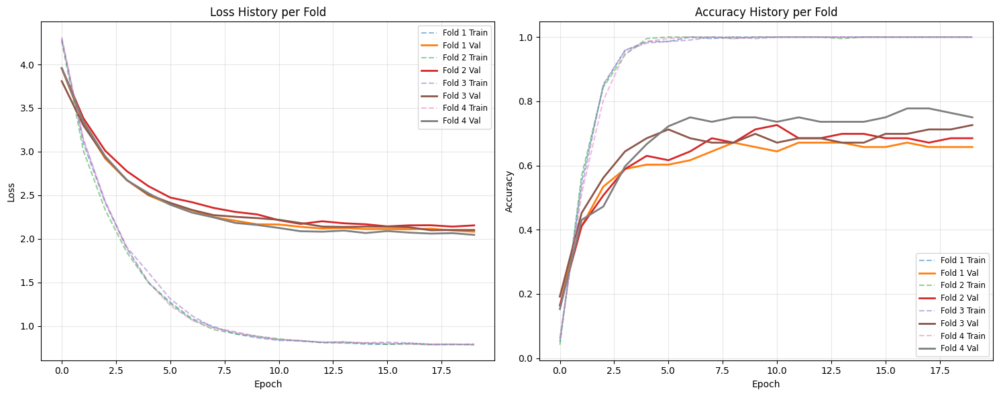


📈 Perkembangan Rata-Rata Akurasi Validasi per Epoch:
[0.17518075 0.42613204 0.51874049 0.60478501 0.64611872 0.66343227
 0.67380137 0.68402778 0.69092466 0.70462329 0.69430175 0.69777397
 0.69430175 0.69430175 0.69087709 0.69777397 0.70814307 0.70471842
 0.70467085 0.70462329]


In [9]:
# ==========================================
# VISUALISASI HISTORY K-FOLD
# ==========================================
plt.figure(figsize=(15, 6))

# --- PLOT LOSS ---
plt.subplot(1, 2, 1)
for i, history in enumerate(all_folds_history):
    # Plot Training (Putus-putus)
    plt.plot(history['train_loss'], linestyle='--', alpha=0.5, label=f'Fold {i+1} Train')
    # Plot Validation (Garis Tegas)
    plt.plot(history['val_loss'], linewidth=2, label=f'Fold {i+1} Val')

plt.title('Loss History per Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)
plt.legend(fontsize='small')

# --- PLOT ACCURACY ---
plt.subplot(1, 2, 2)
for i, history in enumerate(all_folds_history):
    # Plot Training (Putus-putus)
    plt.plot(history['train_acc'], linestyle='--', alpha=0.5, label=f'Fold {i+1} Train')
    # Plot Validation (Garis Tegas)
    plt.plot(history['val_acc'], linewidth=2, label=f'Fold {i+1} Val')

plt.title('Accuracy History per Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True, alpha=0.3)
plt.legend(fontsize='small')

plt.tight_layout()
plt.show()

# --- PRINT RATA-RATA PERFORMACE ---
import numpy as np
# Hitung rata-rata Loss/Acc per epoch dari semua fold
avg_val_acc = np.mean([h['val_acc'] for h in all_folds_history], axis=0)
print("\n📈 Perkembangan Rata-Rata Akurasi Validasi per Epoch:")
print(avg_val_acc)